In [1]:
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np


In [2]:
# RUTAS

# 1. Definimos la raíz del proyecto, subiend un nivel a la carpeta principal.
DIRECTORIO_RAIZ = Path.cwd().parent

# 2. Definimos las rutas a las carpetas específicas
carpeta_imagenes = DIRECTORIO_RAIZ / "imagenes"

carpeta_img_originales = carpeta_imagenes / "originales"
carpeta_img_procesadas = carpeta_imagenes / "procesadas"
carpeta_img_descartes = carpeta_imagenes / "descartes"

# Crear las carpetas si por alguna razón no existen
carpeta_img_originales.mkdir(parents=True, exist_ok=True)
carpeta_img_procesadas.mkdir(parents=True, exist_ok=True)
carpeta_img_descartes.mkdir(parents=True, exist_ok=True)

In [3]:
# FUNCIONES

def cargar_rgb(ruta):
    """Abre una imagen color y la devuelve en formato RGB."""
    # Leemos la imagen con OpenCV en formato BGR.
    imagen_bgr = cv2.imread(str(ruta), cv2.IMREAD_COLOR)

    # Verificamos que la lectura haya sido correcta.
    if imagen_bgr is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {ruta}")

    # Convertimos de BGR a RGB para visualizar correctamente con Matplotlib.
    imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)
    return imagen_rgb


def cargar_gris(ruta):
    """Abre una imagen en escala de grises."""
    # Leemos la imagen directamente como grises.
    imagen_gris = cv2.imread(str(ruta), cv2.IMREAD_GRAYSCALE)

    # Verificamos que la lectura haya sido correcta.
    if imagen_gris is None:
        raise FileNotFoundError(f"No se pudo leer la imagen: {ruta}")

    return imagen_gris


def mostrar_imagen(imagen, titulo="Imagen"):
    """Muestra una sola imagen con un titulo."""
    # Definimos el tamano general de la figura.
    plt.figure(figsize=(7, 6), constrained_layout=True)

    # Elegimos el mapa de color segun la cantidad de dimensiones.
    mapa_de_color = None
    if imagen.ndim == 2:
        mapa_de_color = "gray"

    # Dibujamos la imagen y su titulo.
    plt.imshow(imagen, cmap=mapa_de_color)
    plt.title(titulo, fontweight="bold", loc="left")
    plt.axis("off")
    plt.show()


def mostrar_comparacion(imagen_izquierda, imagen_derecha, titulo_izquierda, titulo_derecha):
    """Muestra una comparacion simple entre dos imagenes."""
    # Creamos una figura con dos ejes lado a lado.
    figura, ejes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

    # Definimos el mapa de color para la imagen izquierda.
    mapa_izquierda = None
    if imagen_izquierda.ndim == 2:
        mapa_izquierda = "gray"

    # Dibujamos la imagen izquierda.
    ejes[0].imshow(imagen_izquierda, cmap=mapa_izquierda)
    ejes[0].set_title(titulo_izquierda, fontweight="bold", loc="left")
    ejes[0].axis("off")

    # Definimos el mapa de color para la imagen derecha.
    mapa_derecha = None
    if imagen_derecha.ndim == 2:
        mapa_derecha = "gray"

    # Dibujamos la imagen derecha.
    ejes[1].imshow(imagen_derecha, cmap=mapa_derecha)
    ejes[1].set_title(titulo_derecha, fontweight="bold", loc="left")
    ejes[1].axis("off")

    plt.show()


def mostrar_histograma_gris(imagen, ruta_guardado=None):
    """Muestra el histograma en grises de una imagen color o gris."""
    # Convertimos a grises si la imagen viene en color.
    imagen_gris = imagen
    if imagen.ndim == 3:
        imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)

    # Calculamos el histograma con NumPy.
    histograma, bordes = np.histogram(imagen_gris.flatten(), bins=256, range=[0, 256])

    # Dibujamos la curva del histograma.
    plt.figure(figsize=(10, 4), constrained_layout=True)
    plt.plot(bordes[:-1], histograma, color="black")
    plt.title("Histograma en escala de grises", fontweight="bold", loc="left")
    plt.xlabel("Intensidad")
    plt.ylabel("Cantidad de pixeles")
    plt.xlim(0, 255)
    plt.grid(alpha=0.3)

    # Guardar imagen del histograma
    if ruta_guardado is not None:
        plt.savefig(ruta_guardado, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close()

def convertir_a_gris(imagen_rgb):
    """Convierte una imagen RGB a escala de grises."""
    imagen_gris = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2GRAY)
    return imagen_gris

def convertir_rgb_a_hsv(imagen_rgb):
    """Convierte una imagen del espacio de color RGB al espacio HSV."""
    imagen_hsv = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2HSV)
    return imagen_hsv

def convertir_hsv_a_rgb(imagen_hsv):
    """Convierte una imagen del espacio de color HSV de vuelta a RGB."""
    imagen_rgb = cv2.cvtColor(imagen_hsv, cv2.COLOR_HSV2RGB)
    return imagen_rgb

def ecualizar_canal_v(imagen_rgb):
    """
    Convierte a HSV, aplica ecualización de histograma solo al canal V (brillo),
    y devuelve la imagen convertida nuevamente a RGB.
    """
    # 1. Convertimos a HSV
    imagen_hsv = convertir_rgb_a_hsv(imagen_rgb)
    
    # 2. Separamos los 3 canales (Hue, Saturation, Value)
    h, s, v = cv2.split(imagen_hsv)
    
    # 3. Ecualizamos el histograma del canal V (mejora el contraste)
    v_ecualizado = cv2.equalizeHist(v)
    
    # 4. Volvemos a unir los canales con el V modificado
    hsv_modificado = cv2.merge([h, s, v_ecualizado])
    
    # 5. Convertimos de vuelta a RGB para poder visualizarla
    imagen_rgb_ecualizada = convertir_hsv_a_rgb(hsv_modificado)
    
    return imagen_rgb_ecualizada

def recortar_imagen(imagen, x_inicio, y_inicio, x_fin, y_fin):
    """
    Recorta una región rectangular de la imagen.
    Usa la notación de 'slicing' de NumPy [y1:y2, x1:x2].
    """
    # Verificamos que las coordenadas estén dentro de la imagen
    alto, ancho = imagen.shape[:2]
    x_inicio = max(0, x_inicio)
    y_inicio = max(0, y_inicio)
    x_fin = min(ancho, x_fin)
    y_fin = min(alto, y_fin)
    
    # NumPy usa filas (y) y luego columnas (x)
    imagen_recortada = imagen[y_inicio:y_fin, x_inicio:x_fin]
    
    return imagen_recortada

def mostrar_canales_rgb(imagen_rgb):
    """Muestra la imagen color y sus tres canales por separado."""
    # Extraemos los tres canales principales.
    canal_rojo = imagen_rgb[:, :, 0]
    canal_verde = imagen_rgb[:, :, 1]
    canal_azul = imagen_rgb[:, :, 2]

    # Creamos una figura de cuatro paneles.
    figura, ejes = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)

    # Mostramos la imagen original.
    ejes[0, 0].imshow(imagen_rgb)
    ejes[0, 0].set_title("Imagen original", fontweight="bold", loc="left")
    ejes[0, 0].axis("off")

    # Mostramos el canal rojo.
    ejes[0, 1].imshow(canal_rojo, cmap="gray")
    ejes[0, 1].set_title("Canal rojo", fontweight="bold", loc="left")
    ejes[0, 1].axis("off")

    # Mostramos el canal verde.
    ejes[1, 0].imshow(canal_verde, cmap="gray")
    ejes[1, 0].set_title("Canal verde", fontweight="bold", loc="left")
    ejes[1, 0].axis("off")

    # Mostramos el canal azul.
    ejes[1, 1].imshow(canal_azul, cmap="gray")
    ejes[1, 1].set_title("Canal azul", fontweight="bold", loc="left")
    ejes[1, 1].axis("off")

    plt.show()


def guardar_rgb(ruta_salida, imagen_rgb):
    """Guarda una imagen RGB en disco."""
    # Convertimos la imagen a BGR para que OpenCV la guarde correctamente.
    imagen_bgr = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2BGR)

    # Guardamos la imagen en la ruta indicada.
    cv2.imwrite(str(ruta_salida), imagen_bgr)


def guardar_gris(ruta_salida, imagen_gris):
    """Guarda una imagen en escala de grises."""
    # Guardamos la imagen directamente en la ruta indicada.
    cv2.imwrite(str(ruta_salida), imagen_gris)


---
## Parte 1 — Cámara oscura y procesamiento digital
---

### 2. Construcción y registro de la cámara oscura

La cámara oscura fue construida con una cartulina, un poco de papel de aluminio con una pequeña abertura (estenopo)por donde ingresa la luz. Los rayos luminosos se propagan en línea recta y proyectan la escena exterior sobre un plano interno (papel de calcar).

Como los rayos que vienen de la parte superior del objeto llegan a la parte inferior del plano, la imagen se forma invertida.

La apertura influye directamente en el resultado: una abertura pequeña mejora la nitidez, pero deja pasar menos luz; una abertura más grande permite mayor luminosidad, pero reduce la definición de la proyección.

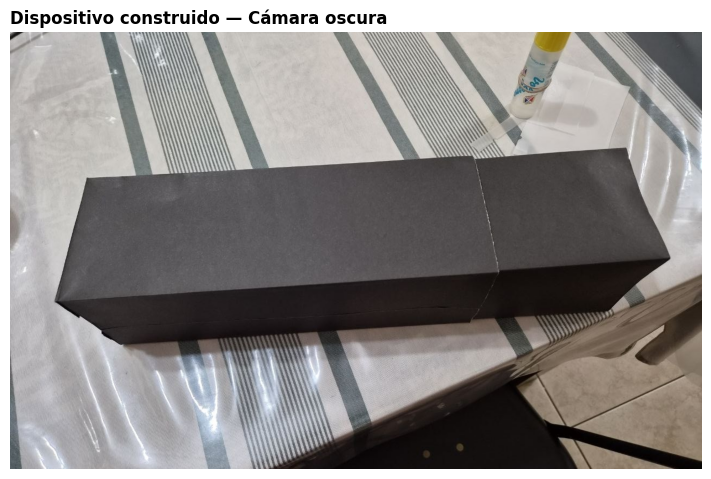

In [4]:
# Registro del dispositivo construido
ruta_dispositivo = carpeta_img_originales / "camara_oscura_dispositivo.jpg"

img_dispositivo = cargar_rgb(ruta_dispositivo)

mostrar_imagen(
    img_dispositivo,
    "Dispositivo construido — Cámara oscura"
)

guardar_rgb(
    carpeta_img_procesadas / "camara_oscura_dispositivo.jpg",
    img_dispositivo
)

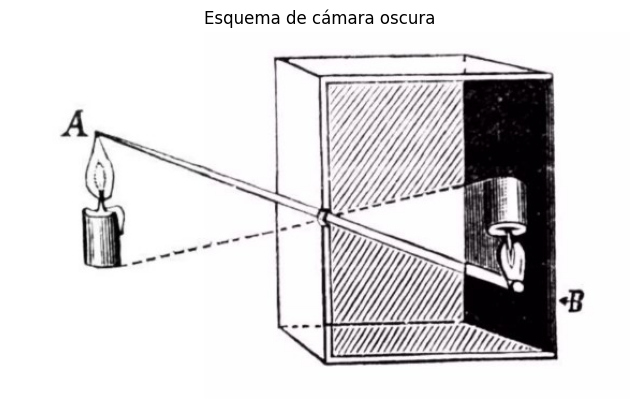

In [9]:
import matplotlib.image as mpimg
ruta_esquema = carpeta_img_originales / "esquema_camara_oscura.jpg"

img_esquema = mpimg.imread(ruta_esquema)

plt.figure(figsize=(8, 6))
plt.imshow(img_esquema)
plt.title("Esquema de cámara oscura")
plt.axis("off")
plt.show()

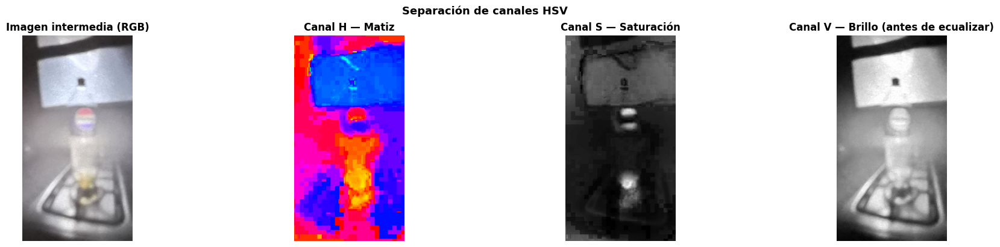

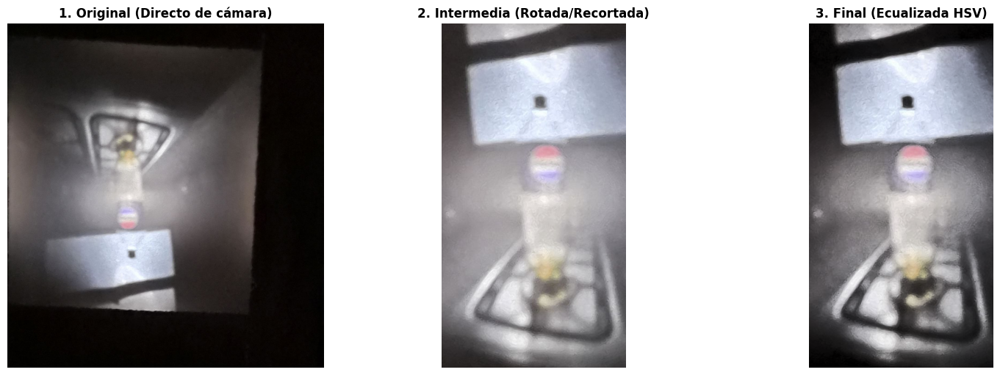

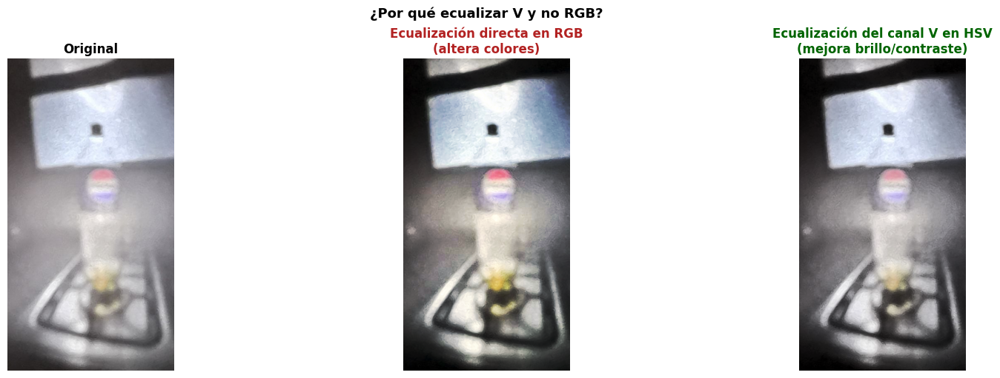

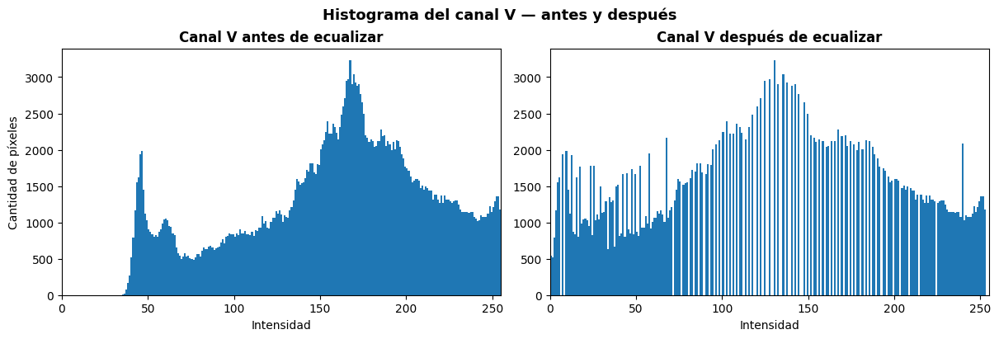

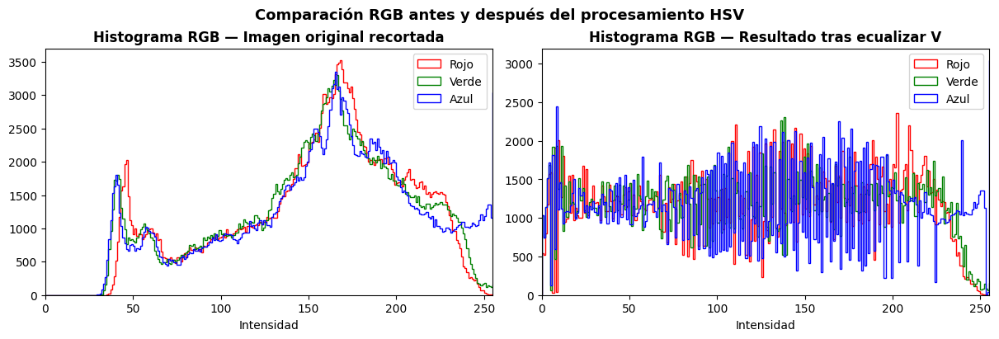

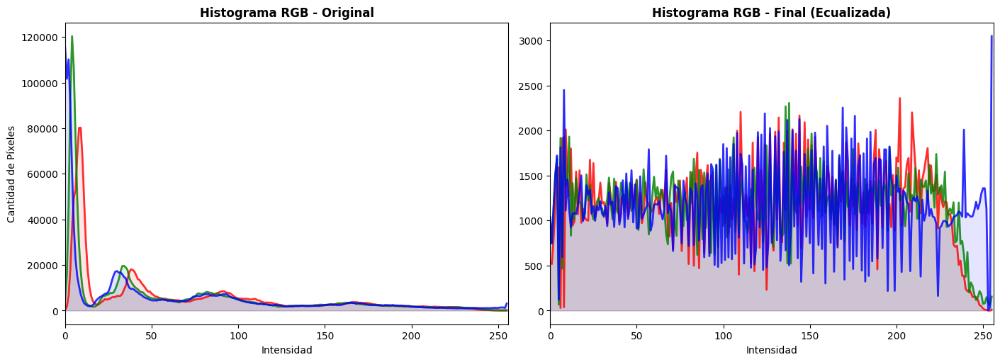

Procesamiento de cámara oscura completado con éxito.


In [ ]:
ruta_foto_oscura = carpeta_img_originales / "001.jpg"

# 2. Cargar imagen en RGB
img_bgr = cv2.imread(str(ruta_foto_oscura))
img_original = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)


# A) Rotar 180 grados (corrige la proyección invertida de la cámara oscura)
img_rotada = cv2.rotate(img_original, cv2.ROTATE_180)


# Recortamos para eliminar el cartón de la cámara
# Formato de recorte en numpy: imagen[y_inicio:y_fin, x_inicio:x_fin]
img_intermedia = img_rotada[250:1000, 500:900]      # 150:1000, 400:900


# C) Convertir a HSV y separar
img_hsv = cv2.cvtColor(img_intermedia, cv2.COLOR_RGB2HSV)

# D) Separar canales H, S y V
h, s, v = cv2.split(img_hsv)


# Visualización de canales HSV
fig_hsv, ejes_hsv = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)

ejes_hsv[0].imshow(img_intermedia)
ejes_hsv[0].set_title("Imagen intermedia (RGB)", fontweight="bold")
ejes_hsv[0].axis("off")

ejes_hsv[1].imshow(h, cmap="hsv")
ejes_hsv[1].set_title("Canal H — Matiz", fontweight="bold")
ejes_hsv[1].axis("off")

ejes_hsv[2].imshow(s, cmap="gray")
ejes_hsv[2].set_title("Canal S — Saturación", fontweight="bold")
ejes_hsv[2].axis("off")

ejes_hsv[3].imshow(v, cmap="gray")
ejes_hsv[3].set_title("Canal V — Brillo (antes de ecualizar)", fontweight="bold")
ejes_hsv[3].axis("off")

plt.suptitle("Separación de canales HSV", fontweight="bold", fontsize=13)
plt.show()

# Guardado para la presentación
fig_hsv.savefig(carpeta_img_procesadas / "canales_hsv.png", dpi=200, bbox_inches="tight")
plt.close(fig_hsv)


# E) Ecualizar ÚNICAMENTE el canal V
# El canal V representa el brillo o luminosidad de la imagen.
# Al modificar solo este canal, se mejora el contraste sin alterar directamente el matiz (H) ni la saturación (S).
v_ecualizado = cv2.equalizeHist(v)

# F) Recomponer la imagen en HSV usando H y S originales + V ecualizado
img_hsv_modificada = cv2.merge([h, s, v_ecualizado])

# G) Volver de HSV a RGB para visualizar y guardar correctamente
img_final = cv2.cvtColor(img_hsv_modificada, cv2.COLOR_HSV2RGB)

# 3. Guardar la imagen procesada
guardar_rgb(carpeta_img_procesadas / "botella_ecualizada.jpg", img_final)

# El Paso a Paso Visual (3 paneles) ---
fig1, ejes1 = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

ejes1[0].imshow(img_original)
ejes1[0].set_title("1. Original (Directo de cámara)", fontweight="bold")
ejes1[0].axis("off")

ejes1[1].imshow(img_intermedia)
ejes1[1].set_title("2. Intermedia (Rotada/Recortada)", fontweight="bold")
ejes1[1].axis("off")

ejes1[2].imshow(img_final)
ejes1[2].set_title("3. Final (Ecualizada HSV)", fontweight="bold")
ejes1[2].axis("off")

plt.show()

# Comparación: ecualizar RGB directo vs ecualizar canal V
img_eq_rgb_directo = img_intermedia.copy()
for i in range(3):
    img_eq_rgb_directo[:, :, i] = cv2.equalizeHist(img_intermedia[:, :, i])

fig_comp, ejes_comp = plt.subplots(1, 3, figsize=(16, 5), constrained_layout=True)

ejes_comp[0].imshow(img_intermedia)
ejes_comp[0].set_title("Original", fontweight="bold")
ejes_comp[0].axis("off")

ejes_comp[1].imshow(img_eq_rgb_directo)
ejes_comp[1].set_title("Ecualización directa en RGB\n(altera colores)", fontweight="bold", color="firebrick")
ejes_comp[1].axis("off")

ejes_comp[2].imshow(img_final)
ejes_comp[2].set_title("Ecualización del canal V en HSV\n(mejora brillo/contraste)", fontweight="bold", color="darkgreen")
ejes_comp[2].axis("off")

plt.suptitle("¿Por qué ecualizar V y no RGB?", fontweight="bold", fontsize=13)
plt.show()

fig_comp.savefig(carpeta_img_procesadas / "comparacion_ecualizacion.png", dpi=200, bbox_inches="tight")
plt.close(fig_comp)


# Histograma del canal V antes y después de la ecualización

img_rgb = img_intermedia.copy()
fig_v, ejes_v = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)

ejes_v[0].hist(v.ravel(), bins=256, range=(0, 256))
ejes_v[0].set_title("Canal V antes de ecualizar", fontweight="bold")
ejes_v[0].set_xlabel("Intensidad")
ejes_v[0].set_ylabel("Cantidad de píxeles")
ejes_v[0].set_xlim(0, 255)

ejes_v[1].hist(v_ecualizado.ravel(), bins=256, range=(0, 256))
ejes_v[1].set_title("Canal V después de ecualizar", fontweight="bold")
ejes_v[1].set_xlabel("Intensidad")
ejes_v[1].set_xlim(0, 255)

plt.suptitle("Histograma del canal V — antes y después", fontweight="bold", fontsize=13)
plt.show()

fig_v.savefig(carpeta_img_procesadas / "histograma_v_antes_despues.png", dpi=200, bbox_inches="tight")
plt.close(fig_v)


# Histograma RGB: imagen original recortada vs imagen ecualizada en HSV

img_rgb = img_intermedia.copy()

fig_rgb, ejes_rgb = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)

canales = [
    ("Rojo", 0, "red"),
    ("Verde", 1, "green"),
    ("Azul", 2, "blue")
]

for nombre, idx, color in canales:
    ejes_rgb[0].hist(
        img_rgb[:, :, idx].ravel(),
        bins=256,
        range=(0, 256),
        histtype="step",
        label=nombre,
        color=color
    )

ejes_rgb[0].set_title("Histograma RGB — Imagen original recortada", fontweight="bold")
ejes_rgb[0].set_xlabel("Intensidad")
ejes_rgb[0].set_xlim(0, 255)
ejes_rgb[0].legend()

for nombre, idx, color in canales:
    ejes_rgb[1].hist(
        img_final[:, :, idx].ravel(),
        bins=256,
        range=(0, 256),
        histtype="step",
        label=nombre,
        color=color
    )
    
ejes_rgb[1].set_title("Histograma RGB — Resultado tras ecualizar V", fontweight="bold")
ejes_rgb[1].set_xlabel("Intensidad")
ejes_rgb[1].set_xlim(0, 255)
ejes_rgb[1].legend()

plt.suptitle("Comparación RGB antes y después del procesamiento HSV", fontweight="bold", fontsize=13)
plt.show()

fig_rgb.savefig(
    carpeta_img_procesadas / "histograma_rgb_original_vs_hsv.png",
    dpi=200,
    bbox_inches="tight"
)

plt.close(fig_rgb)

# Comparación de Histogramas RGB (2 paneles)
fig2, ejes2 = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)
colores = ('red', 'green', 'blue')

# Histograma Original
for i, color in enumerate(colores):
    # Calculamos sobre la imagen original
    hist = cv2.calcHist([img_original], [i], None, [256], [0, 256])
    ejes2[0].plot(hist, color=color, alpha=0.8, linewidth=2)
    ejes2[0].fill_between(range(256), hist.flatten(), color=color, alpha=0.1)

ejes2[0].set_title("Histograma RGB - Original", fontweight="bold")
ejes2[0].set_xlim([0, 256])
ejes2[0].set_xlabel("Intensidad")
ejes2[0].set_ylabel("Cantidad de Píxeles")

# Histograma Final
for i, color in enumerate(colores):
    # Calculamos sobre la imagen final procesada
    hist = cv2.calcHist([img_final], [i], None, [256], [0, 256])
    ejes2[1].plot(hist, color=color, alpha=0.8, linewidth=2)
    ejes2[1].fill_between(range(256), hist.flatten(), color=color, alpha=0.1)

ejes2[1].set_title("Histograma RGB - Final (Ecualizada)", fontweight="bold")
ejes2[1].set_xlim([0, 256])
ejes2[1].set_xlabel("Intensidad")

plt.show()

print("Procesamiento de cámara oscura completado con éxito.")

### Análisis de la ecualización HSV

La imagen capturada con la cámara oscura presentaba bajo contraste y poca luminosidad debido a las limitaciones del dispositivo: entra poca luz por la abertura y la proyección pierde definición.

Para mejorar la legibilidad se convirtió la imagen al espacio HSV. En este modelo, el canal H contiene el matiz, el canal S contiene la saturación y el canal V contiene el brillo. Por eso se ecualizó únicamente el canal V: de esta forma se mejora la distribución de luminosidades sin modificar directamente el color original de la escena.

---
## Parte 2 — Composición y lenguaje visual
---

### 4. Fotografía de simplicidad visual
Objetivo: Construir una imagen donde el sujeto principal sea claramente identificable.


Cargando: d:\vega-sebastian-pdi-1c-2026\006_FotografiaDigital\imagenes\originales\002.jpg


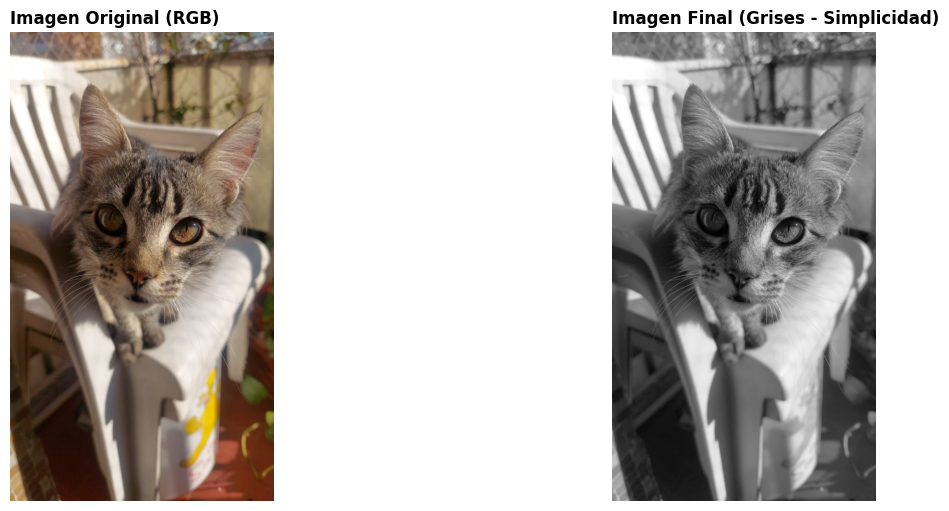

La imagen original '002.jpg' fue procesada.
El resultado se guardó en: d:\vega-sebastian-pdi-1c-2026\006_FotografiaDigital\imagenes\procesadas\gato_simplicidad_final.jpg


In [11]:
# Definimos el nombre del archivo
nombre_gato_original = "002.jpg"

# Armamos la ruta completa a la foto original
ruta_gato_original = carpeta_img_originales / nombre_gato_original

# Carga de img
print(f"Cargando: {ruta_gato_original}")
img_gato_rgb = cargar_rgb(ruta_gato_original)

img_gato_gris = convertir_a_gris(img_gato_rgb)

# 4. Mostramos la comparación (Original vs Procesada)
# Usamos tu función existente
mostrar_comparacion(
    img_gato_rgb, 
    img_gato_gris, 
    "Imagen Original (RGB)", 
    "Imagen Final (Grises - Simplicidad)"
)

# 5. Guardamos la imagen procesada
nombre_gato_procesada = "gato_simplicidad_final.jpg"
ruta_gato_guardado = carpeta_img_procesadas / nombre_gato_procesada
guardar_gris(ruta_gato_guardado, img_gato_gris)

print(f"La imagen original '{nombre_gato_original}' fue procesada.")
print(f"El resultado se guardó en: {ruta_gato_guardado}")

### Análisis compositivo — Simplicidad visual

En esta imagen el objetivo fue construir una lectura clara del sujeto principal. La conversión a escala de grises reduce la información cromática y obliga a leer la fotografía a partir de la forma, el contraste y la textura.

El color podía funcionar como una distracción, especialmente en el fondo y en los elementos secundarios. Al eliminarlo, la atención se concentra más en el sujeto y en la diferencia tonal entre figura y entorno.

La imagen final no busca agregar información, sino simplificar la lectura visual.

### 5. Reencuadre y reinterpretación
Objetivo: Demostrar que cambiar el encuadre modifica el significado de la imagen.


Cargando: d:\vega-sebastian-pdi-1c-2026\006_FotografiaDigital\imagenes\originales\005.jpg


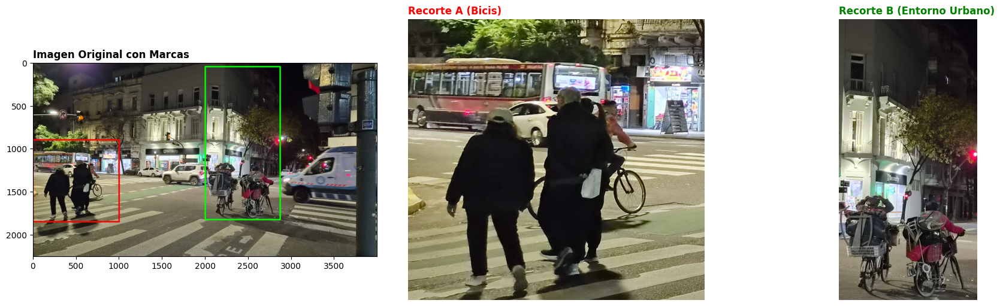

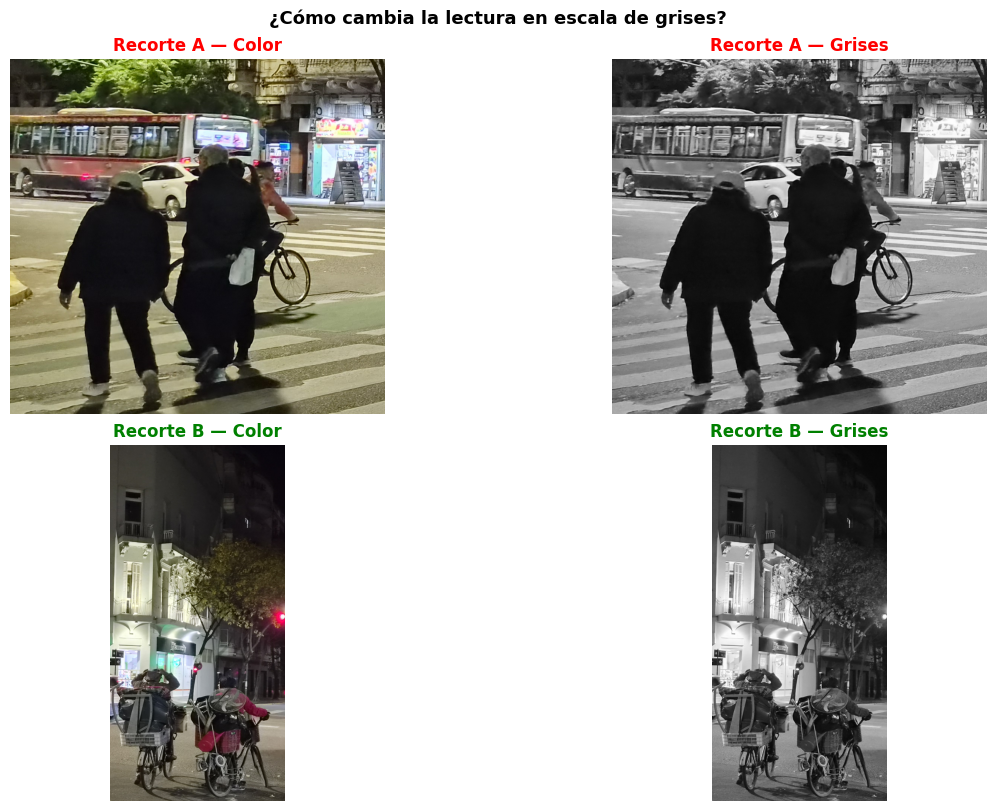

¡Imágenes del Punto 5 procesadas y guardadas con éxito!


In [12]:
# 1. Definimos el archivo y lo cargamos
nombre_foto_noche = "005.jpg"
ruta_foto_noche = carpeta_img_originales / nombre_foto_noche

print(f"Cargando: {ruta_foto_noche}")
img_noche_rgb = cargar_rgb(ruta_foto_noche)

# 2. Definir coordenadas para recorte (x_inicio, (izq) y_inicio (arriba), x_fin (derecha), y_fin (abajo))
# coord_A: Enfocado en las personas con las bicis cruzando (Narrativa humana)
coord_A = (0, 900, 1000, 1850) 

# coord_B: Enfocado en el edificio Farmacity y la relación con los ciclistas
coord_B = (2000, 50, 2870, 1825) 

# 3. Aplicamos los recorts
recorte_A = recortar_imagen(img_noche_rgb, *coord_A)
recorte_B = recortar_imagen(img_noche_rgb, *coord_B)

# 4. Dibujar las marcas en la imagen original
# Hacemos una copia para no arruinar la original
img_con_marcas = img_noche_rgb.copy()

# Dibujamos un rectángulo rojo para el Recorte A (Grosor: 15)
cv2.rectangle(img_con_marcas, (coord_A[0], coord_A[1]), (coord_A[2], coord_A[3]), (255, 0, 0), 15)

# Dibujamos un rectángulo verde para el Recorte B (Grosor: 15)
cv2.rectangle(img_con_marcas, (coord_B[0], coord_B[1]), (coord_B[2], coord_B[3]), (0, 255, 0), 15)

# 5. MOSTRAR TODO PARA LA DIAPOSITIVA
# Creamos una figura con 3 paneles (1 fila, 3 columnas)
figura, ejes = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)

# Panel 1: Original con marcas (Dejamos los ejes encendidos para medir)
ejes[0].imshow(img_con_marcas)
ejes[0].set_title("Imagen Original con Marcas", fontweight="bold", loc="left")
ejes[0].axis("on")          # Ejes encendidos para ver los pixeles

# Panel 2: Recorte A
ejes[1].imshow(recorte_A)
ejes[1].set_title("Recorte A (Bicis)", fontweight="bold", loc="left", color="red")
ejes[1].axis("off")

# Panel 3: Recorte B
ejes[2].imshow(recorte_B)
ejes[2].set_title("Recorte B (Entorno Urbano)", fontweight="bold", loc="left", color="green")
ejes[2].axis("off")

plt.show()


# REcortes en escala de grises
recorte_A_gris = convertir_a_gris(recorte_A)
recorte_B_gris = convertir_a_gris(recorte_B)

fig_gris, ejes_gris = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)

ejes_gris[0, 0].imshow(recorte_A)
ejes_gris[0, 0].set_title("Recorte A — Color", fontweight="bold", color="red")
ejes_gris[0, 0].axis("off")

ejes_gris[0, 1].imshow(recorte_A_gris, cmap="gray")
ejes_gris[0, 1].set_title("Recorte A — Grises", fontweight="bold", color="red")
ejes_gris[0, 1].axis("off")

ejes_gris[1, 0].imshow(recorte_B)
ejes_gris[1, 0].set_title("Recorte B — Color", fontweight="bold", color="green")
ejes_gris[1, 0].axis("off")

ejes_gris[1, 1].imshow(recorte_B_gris, cmap="gray")
ejes_gris[1, 1].set_title("Recorte B — Grises", fontweight="bold", color="green")
ejes_gris[1, 1].axis("off")

plt.suptitle("¿Cómo cambia la lectura en escala de grises?", fontweight="bold", fontsize=13)
plt.show()

fig_gris.savefig(carpeta_img_procesadas / "recortes_grises.png", dpi=200, bbox_inches="tight")
plt.close(fig_gris)


# 6. Guardado
ruta_guardado_marcas = carpeta_img_procesadas / "noche_marcas.jpg"
ruta_guardado_A = carpeta_img_procesadas / "noche_recorte_A.jpg"
ruta_guardado_B = carpeta_img_procesadas / "noche_recorte_B.jpg"

guardar_rgb(ruta_guardado_marcas, img_con_marcas)
guardar_rgb(ruta_guardado_A, recorte_A)
guardar_rgb(ruta_guardado_B, recorte_B)

print("¡Imágenes del Punto 5 procesadas y guardadas con éxito!")

### Análisis compositivo — Reencuadre y reinterpretación

La fotografía original contiene más información contextual: calle, edificios, luces, personas y movimiento urbano. Al realizar los recortes, cambia el centro de atención y también cambia el sentido de la imagen.

En el recorte A, la lectura se concentra más en las personas y la bicicleta. La escena se vuelve más humana y narrativa porque aparece una acción concreta.

En el recorte B, el edificio y el entorno urbano toman mayor importancia. La imagen se vuelve menos centrada en las personas y más vinculada con el espacio.

El reencuadre demuestra que una misma fotografía puede producir lecturas distintas según qué información se conserva y qué información se excluye.

### 6. Punto de vista y construcción narrativa
Objetivo: Explorar cómo la posición de la cámara modifica:


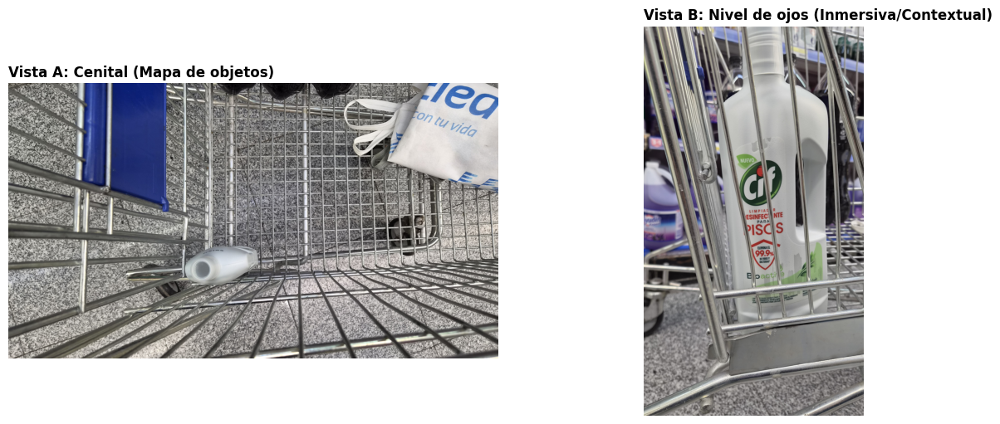

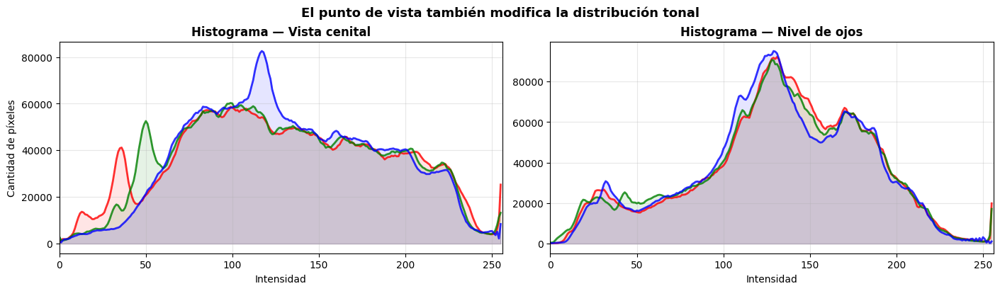

Punto 6: Comparación generada y foto final guardada.


In [14]:
# 1. Definimos los archivos
ruta_cenital = carpeta_img_originales / "006_01.jpg"
ruta_ojo = carpeta_img_originales / "006_02.jpg"

# 2. Cargamos
img_cenital = cargar_rgb(ruta_cenital)
img_ojo = cargar_rgb(ruta_ojo)

# Rotamos la imagen cenital 90 grados
img_cenital_rotada = cv2.rotate(img_cenital, cv2.ROTATE_90_COUNTERCLOCKWISE)

# 3. Mostramos la comparación narrativa
mostrar_comparacion(
    img_cenital_rotada, 
    img_ojo, 
    "Vista A: Cenital (Mapa de objetos)", 
    "Vista B: Nivel de ojos (Inmersiva/Contextual)"
)


# Comparación de histogramas: cenital vs nivel de ojos
fig_hist6, ejes_hist6 = plt.subplots(1, 2, figsize=(14, 4), constrained_layout=True)
colores = ('red', 'green', 'blue')

for i, color in enumerate(colores):
    hist = cv2.calcHist([img_cenital_rotada], [i], None, [256], [0, 256])
    ejes_hist6[0].plot(hist, color=color, alpha=0.8, linewidth=2)
    ejes_hist6[0].fill_between(range(256), hist.flatten(), color=color, alpha=0.1)

ejes_hist6[0].set_title("Histograma — Vista cenital", fontweight="bold")
ejes_hist6[0].set_xlim([0, 256])
ejes_hist6[0].set_xlabel("Intensidad")
ejes_hist6[0].set_ylabel("Cantidad de píxeles")
ejes_hist6[0].grid(alpha=0.3)

for i, color in enumerate(colores):
    hist = cv2.calcHist([img_ojo], [i], None, [256], [0, 256])
    ejes_hist6[1].plot(hist, color=color, alpha=0.8, linewidth=2)
    ejes_hist6[1].fill_between(range(256), hist.flatten(), color=color, alpha=0.1)

ejes_hist6[1].set_title("Histograma — Nivel de ojos", fontweight="bold")
ejes_hist6[1].set_xlim([0, 256])
ejes_hist6[1].set_xlabel("Intensidad")
ejes_hist6[1].grid(alpha=0.3)

plt.suptitle("El punto de vista también modifica la distribución tonal", fontweight="bold", fontsize=13)
plt.show()

fig_hist6.savefig(carpeta_img_procesadas / "histogramas_punto_vista.png", dpi=200, bbox_inches="tight")
plt.close(fig_hist6)


# 4. Guardamos la elegida como final para el TP
ruta_final_p6 = carpeta_img_procesadas / "changuito_final_narrativa.jpg"
guardar_rgb(ruta_final_p6, img_ojo)

print("Punto 6: Comparación generada y foto final guardada.")

### Análisis compositivo — Punto de vista

Las dos imágenes muestran un mismo objeto desde posiciones diferentes. La vista cenital organiza los objetos como si fueran parte de un mapa: se entiende mejor la distribución espacial, pero se pierde algo de información.

La vista a nivel de ojos genera una relación más directa. El objeto se percibe con mayor presencia y aparece más contexto, mas información.

El cambio de punto de vista modifica la información disponible y también la relación del espectador con la imagen. No se trata solo de mirar el mismo objeto desde otro lugar, sino de construir otro tipo de lectura visual.

### 7. Fotografía basada en la luz
Objetivo: Usar la luz como elemento estructural de la imagen.


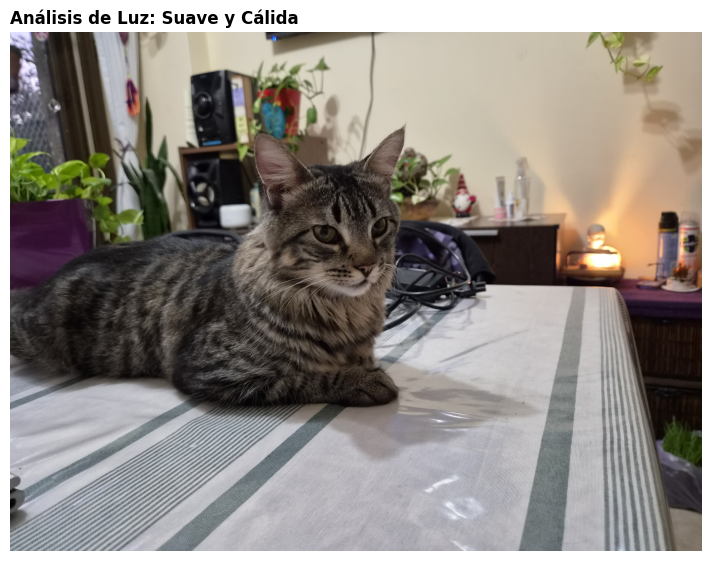

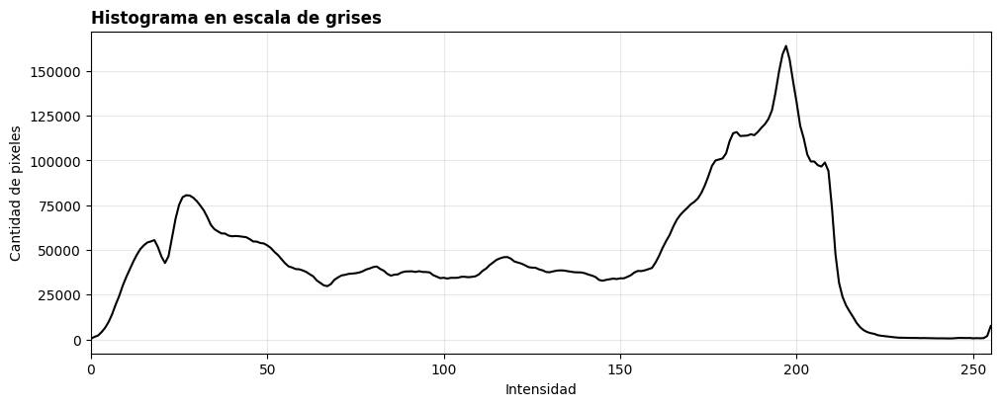

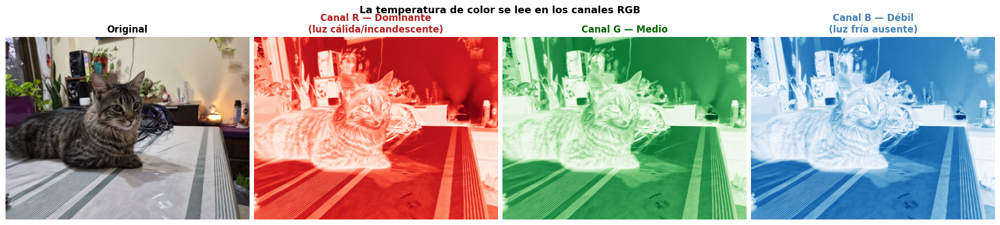

Promedio canal R: 131.9
Promedio canal G: 125.4
Promedio canal B: 119.1
→ El canal R debería ser el más alto en una luz cálida.


In [5]:
# 1. Cargamos la foto del gato con luz de lámpara
ruta_luz = carpeta_img_originales / "007.jpg"
img_luz_rgb = cargar_rgb(ruta_luz)

# 2. Mostramos la imagen y su histograma para analizar la atmósfera
mostrar_imagen(img_luz_rgb, "Análisis de Luz: Suave y Cálida")

ruta_histograma = carpeta_img_procesadas / "histograma_gato_luz.png"
mostrar_histograma_gris(img_luz_rgb, ruta_guardado=ruta_histograma)

# Análisis de canales RGB — LUZ CÁLIDA
canal_r = img_luz_rgb[:, :, 0]
canal_g = img_luz_rgb[:, :, 1]
canal_b = img_luz_rgb[:, :, 2]

fig_canales, ejes_c = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)

ejes_c[0].imshow(img_luz_rgb)
ejes_c[0].set_title("Original", fontweight="bold")
ejes_c[0].axis("off")

ejes_c[1].imshow(canal_r, cmap="Reds")
ejes_c[1].set_title("Canal R — Dominante\n(luz cálida/incandescente)", fontweight="bold", color="firebrick")
ejes_c[1].axis("off")

ejes_c[2].imshow(canal_g, cmap="Greens")
ejes_c[2].set_title("Canal G — Medio", fontweight="bold", color="darkgreen")
ejes_c[2].axis("off")

ejes_c[3].imshow(canal_b, cmap="Blues")
ejes_c[3].set_title("Canal B — Débil\n(luz fría ausente)", fontweight="bold", color="steelblue")
ejes_c[3].axis("off")

plt.suptitle("La temperatura de color se lee en los canales RGB", fontweight="bold", fontsize=13)
plt.show()

fig_canales.savefig(carpeta_img_procesadas / "canales_rgb_luz.png", dpi=200, bbox_inches="tight")
plt.close(fig_canales)

# Verificación numérica: promedio por canal
print(f"Promedio canal R: {canal_r.mean():.1f}")
print(f"Promedio canal G: {canal_g.mean():.1f}")
print(f"Promedio canal B: {canal_b.mean():.1f}")
print("→ El canal R debería ser el más alto en una luz cálida.")


# 3. Guardado img
ruta_final_p7 = carpeta_img_procesadas / "gato_luz_atmosfera.jpg"
guardar_rgb(ruta_final_p7, img_luz_rgb)

### Análisis visual — Fotografía basada en la luz

En esta fotografía la luz funciona como elemento estructural de la imagen. La iluminación cálida genera una atmósfera íntima y dirige la atención hacia el sujeto.

La dirección de la luz revela algunas zonas y oculta otras, produciendo contraste y volumen. Las sombras no son solamente ausencia de información: ayudan a construir profundidad y a separar al sujeto del fondo.

El predominio del canal rojo en el análisis RGB confirma la presencia de una luz cálida. el canal rojo concentra mayor información en las zonas iluminadas, el verde aparece en un nivel intermedio y el azul queda más débil por la menor presencia de luz fría.

---
## Parte 3 — Reflexión y selección
---

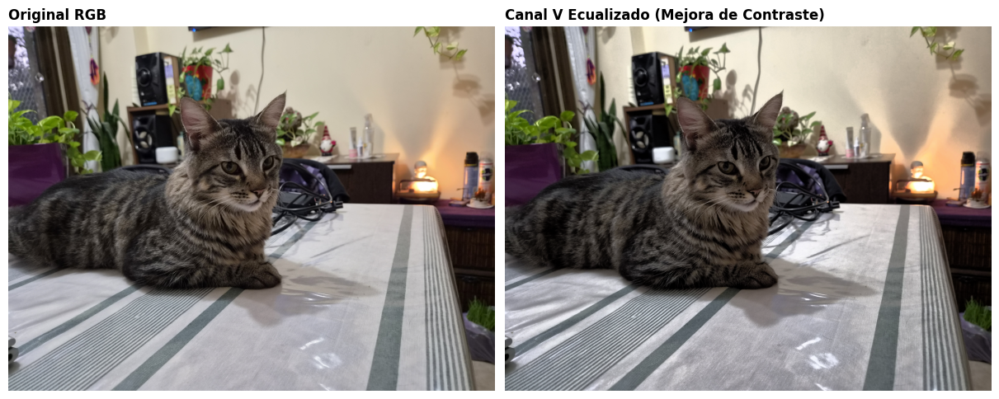

In [17]:
# Prueba técnica obligatoria para el Anexo
# 1. Aplicamos la ecualización del canal V (Brillo en HSV)
img_ecualizada = ecualizar_canal_v(img_luz_rgb)

# 2. Mostramos el resultado técnico
mostrar_comparacion(
    img_luz_rgb, 
    img_ecualizada, 
    "Original RGB", 
    "Canal V Ecualizado (Mejora de Contraste)"
)

# 3. Guardamos la prueba técnica
guardar_rgb(carpeta_img_procesadas / "anexo_tecnico_ecualizacion.jpg", img_ecualizada)

Buscando imágenes en: d:\vega-sebastian-pdi-1c-2026\006_FotografiaDigital\imagenes\descartes...
¡Se encontraron 4 imágenes únicas! Armando miniaturas...
Collage guardado exitosamente en: d:\vega-sebastian-pdi-1c-2026\006_FotografiaDigital\imagenes\procesadas\collage_descartes.jpg


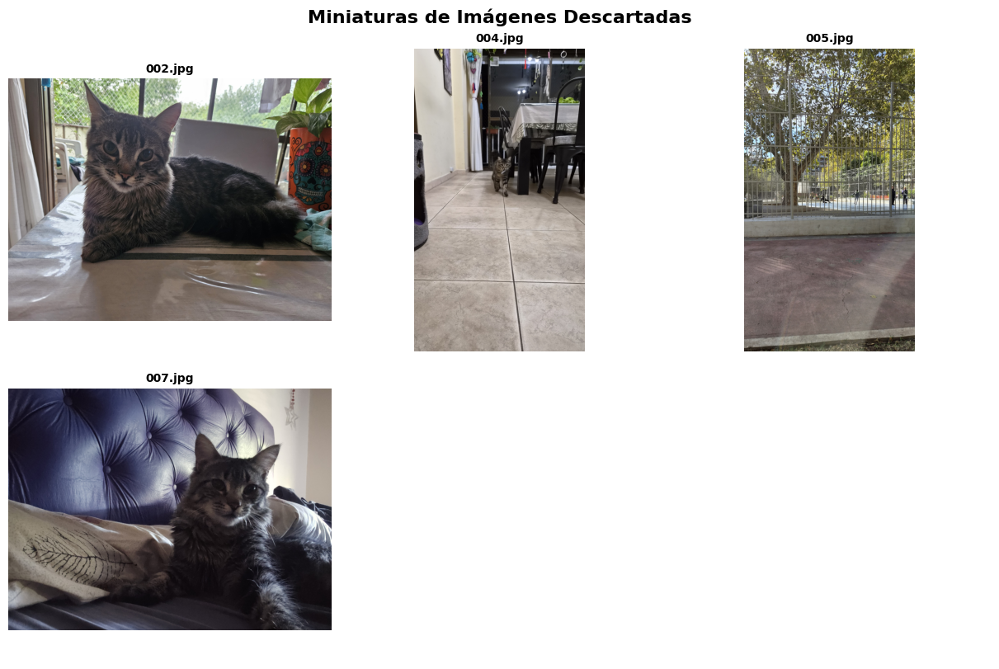

In [ ]:
# Minuaturas de los descartes.
import math
from pathlib import Path
import matplotlib.pyplot as plt

def crear_collage_descartes(carpeta_origen, carpeta_destino):
    """
    Lee todas las imágenes de una carpeta, crea una grilla con miniaturas
    y muestra/guarda el resultado.
    """
    print(f"Buscando imágenes en: {carpeta_origen}...")
    
    # 1. Buscar archivos y filtrar por extensión (solucionado el tema de duplicidad de imagenes)
    # iterdir() lee todo en la carpeta, y suffix.lower() asegura que 
    # ".JPG" y ".jpg" se traten igual sin buscar dos veces.
    extensiones_validas = ['.jpg', '.jpeg', '.png']
    archivos = [archivo for archivo in carpeta_origen.iterdir() 
                if archivo.suffix.lower() in extensiones_validas]
        
    num_imagenes = len(archivos)
    
    if num_imagenes == 0:
        print("No se encontraron imágenes en la carpeta de descartes.")
        return
        
    print(f"¡Se encontraron {num_imagenes} imágenes únicas! Armando miniaturas...")

    # 2. Calcular cuántas filas y columnas necesitamos
    columnas = min(3, num_imagenes) 
    filas = math.ceil(num_imagenes / columnas)

    # 3. Crear la figura de Matplotlib
    # Ajustamos el tamaño total dependiendo de la cantidad de filas y columnas
    figura, ejes = plt.subplots(filas, columnas, figsize=(4 * columnas, 4 * filas), constrained_layout=True)
    
    # Si hay una sola imagen, 'ejes' no es una lista, así que lo forzamos.
    # Y si es una matriz 2D, la aplanamos a 1D con flatten() para iterar más fácil.
    if num_imagenes == 1:
        ejes = [ejes]
    else:
        ejes = ejes.flatten()

    # 4. Cargar y mostrar cada imagen
    for i, ruta_archivo in enumerate(archivos):
        try:
            # Usamos tu función para cargar
            img = cargar_rgb(ruta_archivo)
            
            # Dibujamos en el panel que toca
            ejes[i].imshow(img)
            # Le ponemos de título el nombre del archivo
            ejes[i].set_title(ruta_archivo.name, fontweight="bold", fontsize=10)
            ejes[i].axis("off")
        except Exception as e:
            print(f"Error al cargar {ruta_archivo.name}: {e}")

    # 5. Ocultar los cuadritos sobrantes (ej: si hay 5 fotos y una grilla de 2x3, sobra 1)
    for j in range(num_imagenes, len(ejes)):
        ejes[j].axis("off")

    # 6. Título general
    figura.suptitle("Miniaturas de Imágenes Descartadas", fontsize=16, fontweight="bold")
    
    # 7. Guardar el collage como una sola imagen en la carpeta procesadas
    ruta_guardado = carpeta_destino / "collage_descartes.jpg"
    plt.savefig(ruta_guardado, dpi=150) 
    print(f"Collage guardado exitosamente en: {ruta_guardado}")
    plt.show()

# --- EJECUTAMOS LA FUNCIÓN ---
crear_collage_descartes(carpeta_img_descartes, carpeta_img_procesadas)

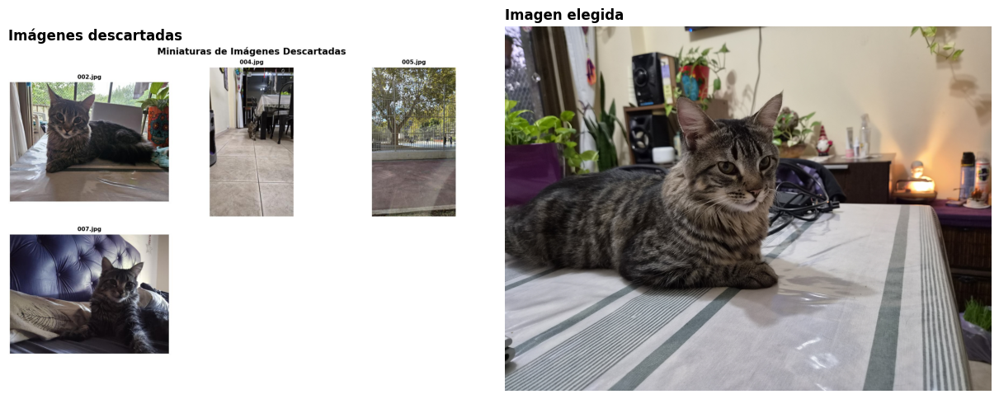

In [19]:
# Comparación entre descartes e imagen elegida

ruta_collage_descartes = carpeta_img_procesadas / "collage_descartes.jpg"
ruta_imagen_elegida = carpeta_img_procesadas / "gato_luz_atmosfera.jpg"

collage_descartes = cargar_rgb(ruta_collage_descartes)
imagen_elegida = cargar_rgb(ruta_imagen_elegida)

mostrar_comparacion(
    collage_descartes,
    imagen_elegida,
    "Imágenes descartadas",
    "Imagen elegida"
)

### Selección crítica

La imagen elegida funciona mejor porque presenta una relación más clara entre sujeto, luz y fondo. La iluminación ayuda a construir atmósfera y guía la mirada hacia el elemento principal.

Las imágenes descartadas fueron útiles como parte del proceso, pero tenían problemas de lectura: algunas presentaban elementos distractores, otras no separaban bien el sujeto del fondo y otras no aprovechaban la luz de manera expresiva.

La selección final no se basó solamente en elegir una imagen más estética, sino en identificar cuál comunicaba mejor una intención visual.

## Reflexión final

Este trabajo me permitió entender que fotografiar no es solamente registrar una escena, sino construir una imagen a partir de decisiones. Mirar implica seleccionar: elegir qué mostrar, qué dejar afuera, desde dónde observar y cómo organizar los elementos dentro del encuadre.

La cámara oscura muestra que toda imagen fotográfica parte de un fenómeno óptico: la luz se proyecta sobre un plano y forma una imagen. Sin embargo, esa proyección no alcanza por sí sola para comunicar una intención. La composición, el punto de vista, la luz y el recorte transforman esa captura en una imagen con sentido.

Registrar es capturar algo que está frente a la cámara. Construir una imagen, en cambio, implica tomar decisiones visuales: simplificar, encuadrar, cambiar el punto de vista, esperar determinada luz o descartar una imagen que no comunica con claridad.

En conclusión, la fotografía digital combina óptica, percepción, composición y procesamiento. La imagen final no depende solo de la cámara, sino de las decisiones tomadas antes, durante y después de la captura.

---
## Anexo técnico

En esta sección se resumen las operaciones digitales utilizadas durante el trabajo:

1. Conversión entre espacios de color RGB y HSV.
2. Separación de canales H, S y V.
3. Ecualización del canal V.
4. Recomposición de la imagen HSV.
5. Conversión de HSV a RGB.
6. Transformación a escala de grises.
7. Recorte de imágenes.
8. Generación de histogramas para análisis tonal.
---

In [20]:
# Anexo técnico — resumen mínimo obligatorio

print("Resumen técnico del procesamiento realizado:")
print("1. RGB → HSV")
print("2. Separación de canales H, S y V")
print("3. Ecualización del canal V")
print("4. Recomposición HSV")
print("5. HSV → RGB")
print("6. RGB → escala de grises")
print("7. Recortes y comparación de encuadres")
print("8. Histogramas antes/después")

Resumen técnico del procesamiento realizado:
1. RGB → HSV
2. Separación de canales H, S y V
3. Ecualización del canal V
4. Recomposición HSV
5. HSV → RGB
6. RGB → escala de grises
7. Recortes y comparación de encuadres
8. Histogramas antes/después
